Using tutorial:
    https://towardsdatascience.com/how-to-cluster-images-based-on-visual-similarity-cd6e7209fe34

In [1]:
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
from random import randint
import pandas as pd
import pickle


#Plotting
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

#Visualizing pictures
from skimage import io
from skimage import exposure
import skimage.color as color
import math
from PIL import Image

In [3]:
#path = '/Users/dianaaguilar/Documents/GitHub/frogFun/sampleImages/AllProcessed/'
#path = '/Users/dianaaguilar/Documents/GitHub/frogFun/ProcessedImages/Grayscale/'
path = '/Users/dianaaguilar/Documents/GitHub/frogFun/ProcessedImages/BinaryGlare/'
# change the working directory to the path where the images are located
os.chdir(path)


In [4]:
# this list holds all the image filename
frogs = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        if file.name.endswith('.png'):
          # adds only the image files to the flowers list
            frogs.append(file.name)

In [5]:
# load the model first and pass as an argument
model = VGG16()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

2023-01-12 12:10:35.958894: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [6]:
def plotGroup(i,name,groups):
    group=groups[i]
    n_frogs=len(group)
    fig, axs = plt.subplots(math.ceil(n_frogs/3), 3)
    fig.set_size_inches(18.5, n_frogs)

    n=0
    y=0
    for frog in group:
        if y==3:
            y= 0
            n+=1 
        image = io.imread(path+frog, pilmode='RGBA')
        gamma2=exposure.adjust_log(image)
        gamma3=exposure.adjust_log(gamma2)
        ranita0 = color.rgba2rgb(gamma3) 
        ranita = color.rgb2gray(ranita0) 
    
        axs[n,y].imshow(image,aspect='auto')
        y+=1
    plt.savefig("../../outputFiles/group_"+name+str(i)+".png")
    #plt.savefig("../../outputFiles/group_grayscale"+str(i)+".png")
    #plt.savefig("../../outputFiles/group_binaryk5"+str(i)+".png")

In [7]:
data = {}
#p = '/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/frogs.pkl'
#p = '/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/frogsgrayscale.pkl'
#p = '/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/frogsbinary.pkl'
p = '/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/frogsbinaryGlare.pkl'
# lop through each image in the dataset
for frog in frogs:
    # try to extract the features and update the dictionary
    try:
        feat = extract_features(frog,model)
        data[frog] = feat
    # if something fails, save the extracted features as a pickle file (optional)
    except:
        with open(p,'wb') as file:
            pickle.dump(data,file)
          

In [8]:
# get a list of the filenames
filenames = np.array(list(data.keys()))

In [9]:
# get a list of just the features
feat = np.array(list(data.values()))
#Reshape
feat = feat.reshape(-1,4096)
#feat.shape

In [10]:
pca = PCA(n_components=100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [11]:
np.shape(x[0:2])

(2, 100)

In [12]:
x[0,2]

9.8808

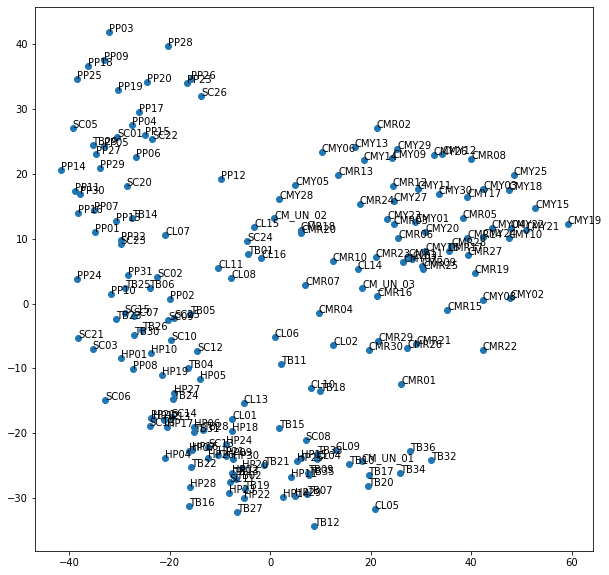

In [13]:
#Plot PCA
fig, axs = plt.subplots()
fig.set_size_inches(10, 10)
plt.scatter(x[:,0],x[:,1])
for i, txt in enumerate(filenames):
    plt.annotate(txt.split("_binary_glare.png")[0], (x[i,0],x[i,1]))

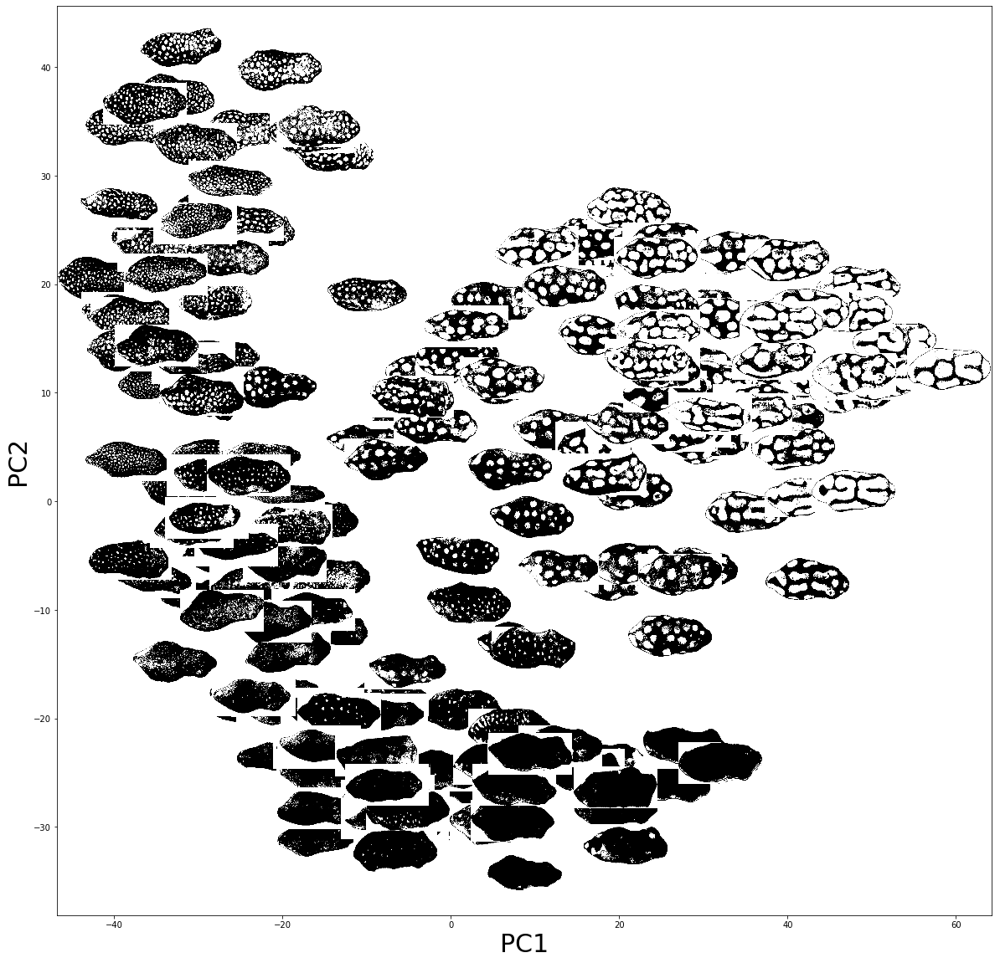

In [14]:
#Plot PCA
def getImage(path, zoom=.2):
    #return OffsetImage(plt.imread(path),cmap=plt.cm.gray_r, zoom=zoom,alpha=1)
    return OffsetImage(Image.open(path).resize((500,250)),cmap=plt.cm.gray_r, zoom=zoom,alpha=1)
fig.clf()
fig, axs = plt.subplots()
fig.set_size_inches(20, 20)
axs.scatter(x[:,0],x[:,1])
for i, txt in enumerate(filenames):
    ab = AnnotationBbox(getImage(txt),(x[i,0],x[i,1]), frameon=False)
    axs.add_artist(ab)

#plt.axhline(y=0)
#plt.axvline(x=0)
plt.ylabel("PC2",size=30)
plt.xlabel("PC1",size=30)
    
#plt.savefig("PCA_Vgg16_binaryglare.png")
plt.savefig("../PCA_Vgg16_binaryglare_v2_fat.png")

In [92]:
txt.split("_binary_glare.png")

['PCA_Vgg16binaryglare_binary.png']

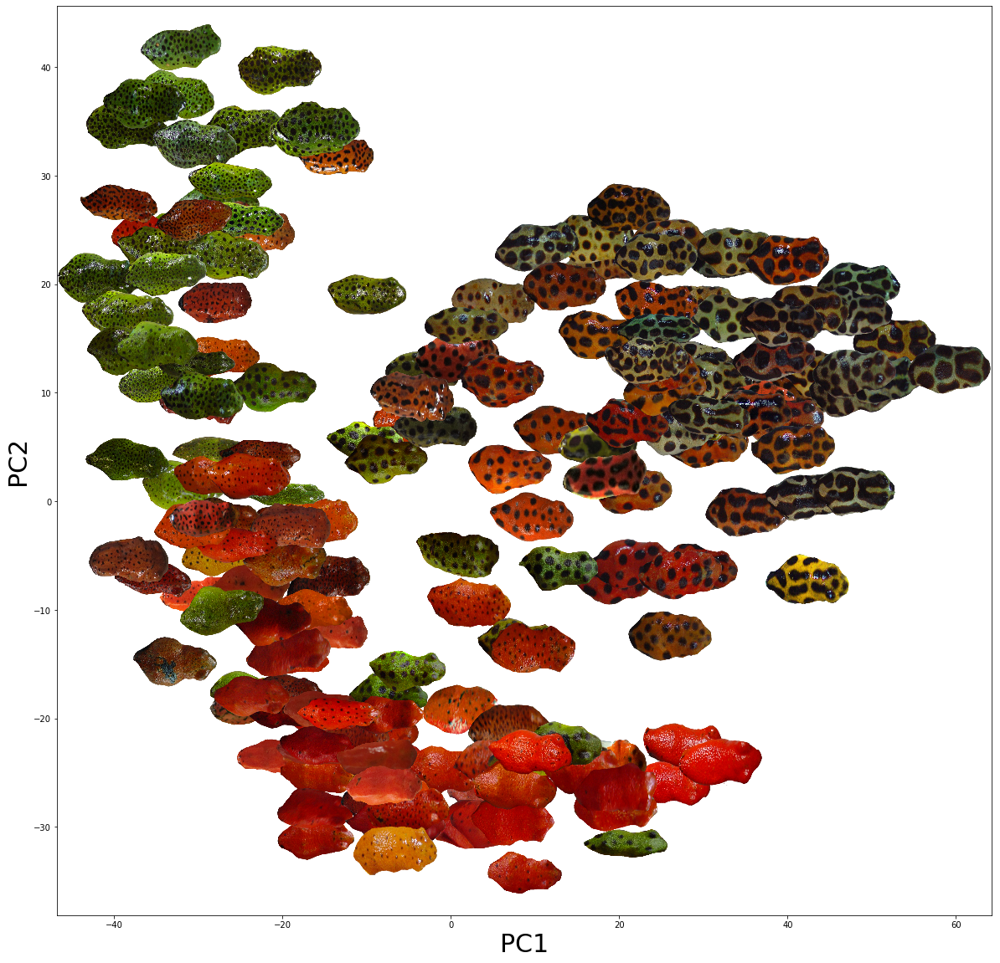

In [15]:
#Plot PCA
def getImage(path, zoom=.2):
    #return OffsetImage(plt.imread(path), zoom=zoom)
    return OffsetImage(Image.open(path).resize((500,300)), zoom=zoom)


pathImage='/Users/dianaaguilar/Documents/GitHub/frogFun/sampleImages/AllProcessed/'
fig, axs = plt.subplots()
fig.set_size_inches(20, 20)
axs.scatter(x[:,0],x[:,1])
for i, txt in enumerate(filenames):
    image=pathImage+txt.split("_binary_glare.png")[0]+"-PD.png"
    ab = AnnotationBbox(getImage(image),(x[i,0],x[i,1]), frameon=False)
    axs.add_artist(ab)

plt.ylabel("PC2",size=30)
plt.xlabel("PC1",size=30)
    
plt.savefig("../PCA_Vgg16binaryglare_originalImagesv2.png")

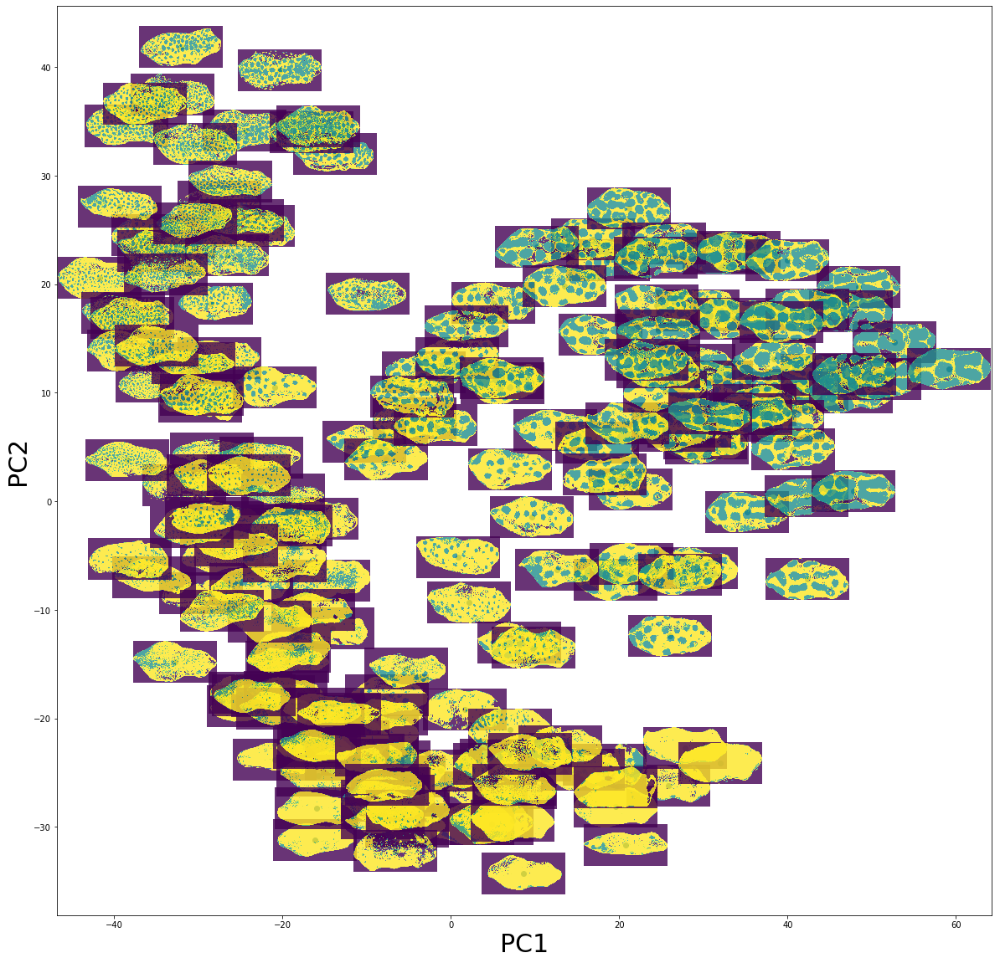

In [65]:
#Plot PCA
def getImage(path, zoom=.2):
    #return OffsetImage(plt.imread(path),cmap=plt.cm.gray_r, zoom=zoom,alpha=1)
    return OffsetImage(Image.open(path).resize((500,250)), zoom=zoom,alpha=.8)
pc0=1
pc1=2

pathImage='/Users/dianaaguilar/Documents/GitHub/frogFun/ProcessedImages/Binary/'
fig, axs = plt.subplots()
fig.set_size_inches(20, 20)

axs.scatter(x[:,pc0-1],x[:,pc1-1])
for i, txt in enumerate(filenames):
    image=pathImage+txt.split("_binary_glare.png")[0]+"_binary.png"
    ab = AnnotationBbox(getImage(image),(x[i,pc0-1],x[i,pc1-1]), frameon=False)
    axs.add_artist(ab)

plt.xlabel("PC"+str(pc0),size=30)
plt.ylabel("PC"+str(pc1),size=30)

    
plt.savefig("../PCA"+str(pc0)+str(pc1)+"_Vgg16binaryglare_binary.png")

In [19]:
remove1st=x[:,2:50]

kmeans = KMeans(n_clusters=3, random_state=21)
kmeans.fit(x)

In [31]:
pd.DataFrame(kmeans.labels_)[0].map(colors)

0        tab:blue
1       tab:green
2      tab:orange
3       tab:green
4        tab:blue
          ...    
188     tab:green
189    tab:orange
190     tab:green
191      tab:blue
192     tab:green
Name: 0, Length: 193, dtype: object

In [56]:
colors

{0: 'tab:orange', 1: 'tab:green', 2: 'black'}

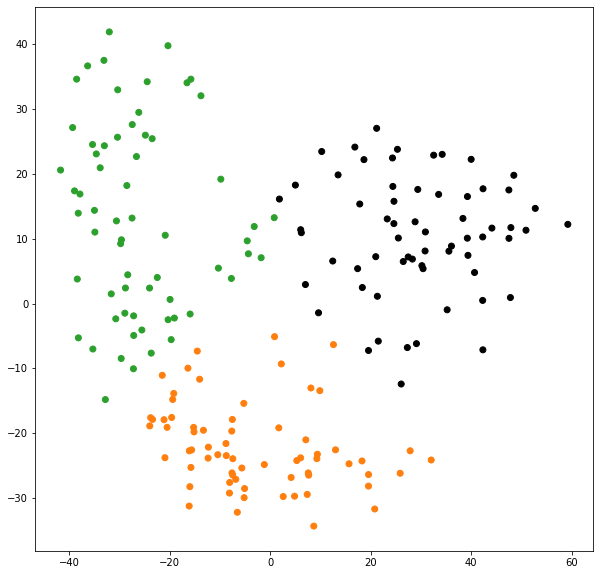

In [58]:
#Plot PCA
fig, axs = plt.subplots()
fig.set_size_inches(10, 10)
colors = {0:'tab:orange', 1:'tab:green', 2:'black'}
plt.scatter(x[:,0],x[:,1],color=pd.DataFrame(kmeans.labels_)[0].map(colors))

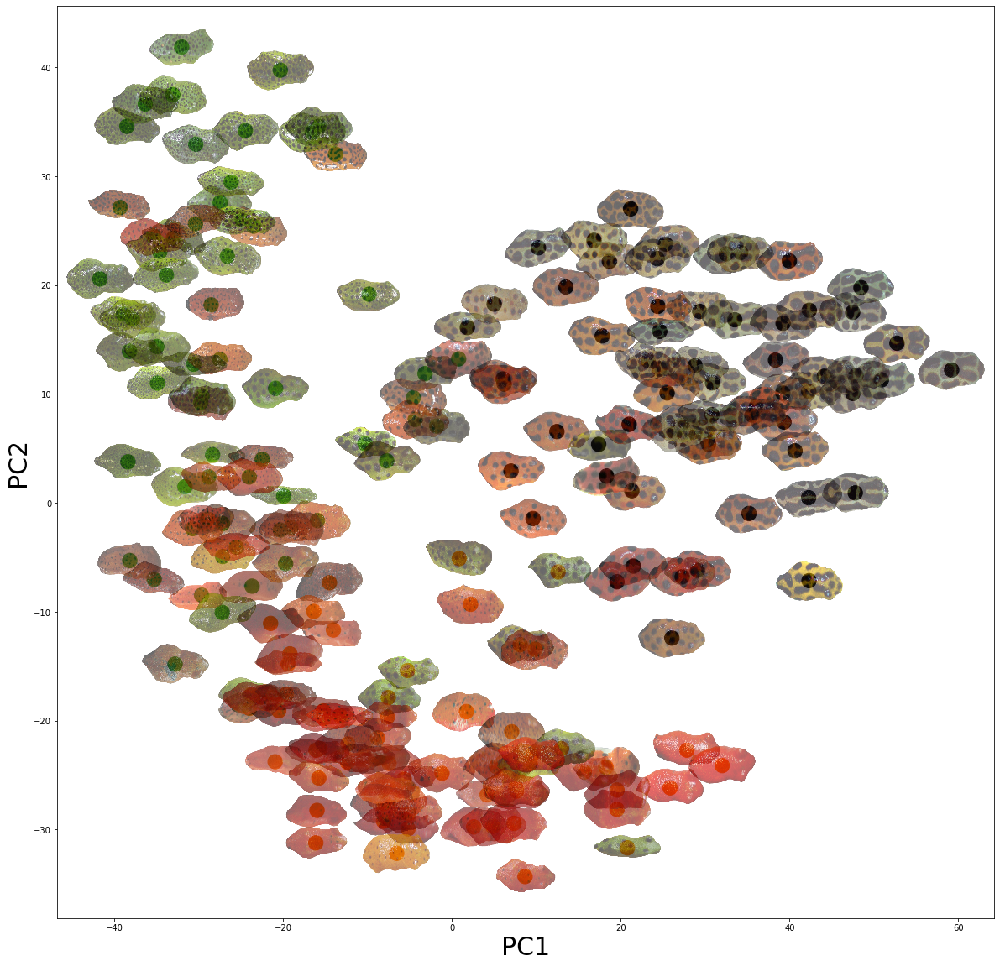

In [59]:
#Plot PCA
def getImage(path, zoom=.2):
    #return OffsetImage(plt.imread(path), zoom=zoom)
    return OffsetImage(Image.open(path).resize((400,240)), zoom=zoom,alpha=.6)



pathImage='/Users/dianaaguilar/Documents/GitHub/frogFun/sampleImages/AllProcessed/'
fig, axs = plt.subplots()
fig.set_size_inches(20, 20)
#axs.scatter(x[:,0],x[:,1])
for i, txt in enumerate(filenames):
    image=pathImage+txt.split("_binary_glare.png")[0]+"-PD.png"
    ab = AnnotationBbox(getImage(image),(x[i,0],x[i,1]), frameon=False)
    axs.add_artist(ab)

plt.ylabel("PC2",size=30)
plt.xlabel("PC1",size=30)
    
plt.scatter(x[:,0],x[:,1],color=pd.DataFrame(kmeans.labels_)[0].map(colors),s=300)

plt.savefig("../PCA_Vgg16binaryglare_originalImagesv2_clusters.png")

In [60]:
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [29]:
group=groups[0]

n_frogs=len(group)
n_frogs

path+group[0]

'/Users/dianaaguilar/Documents/GitHub/frogFun/ProcessedImages/BinaryGlare/TB34_binary_glare.png'

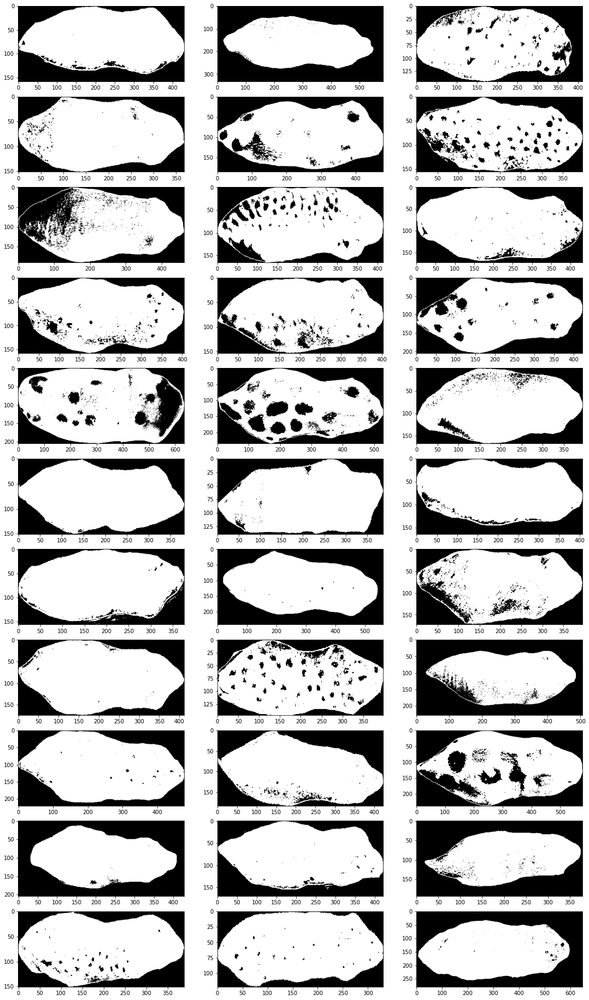

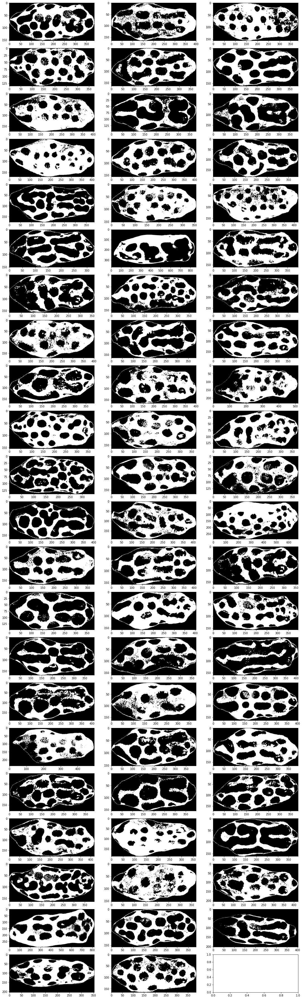

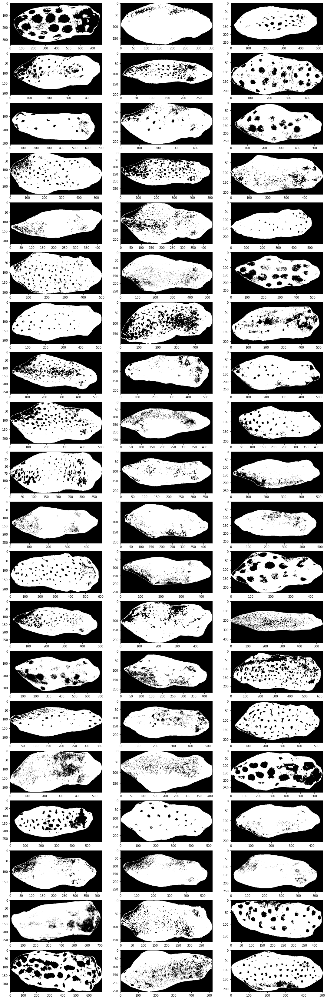

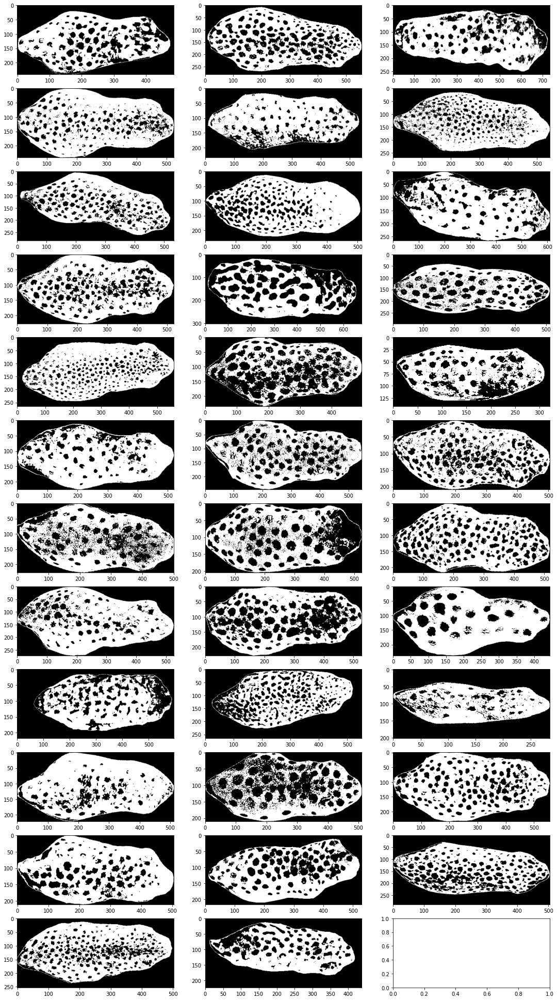

In [30]:
for i in groups:
    plotGroup(i,"binaryGlare_k4_allPops_v2",groups)

In [31]:
classesk4=pd.DataFrame(groups.items(), columns=['vgg16_k4', 'frog']).explode('frog').reset_index(drop=True)

In [61]:
clustersk3=pd.DataFrame(groups.items(), columns=['vgg16_clustersk3', 'frog']).explode('frog').reset_index(drop=True)

## Write it down

In [24]:
classes=pd.DataFrame(groups.items(), columns=['vgg16_k6', 'frog']).explode('frog').reset_index(drop=True)
classes=pd.DataFrame(groups.items(), columns=['vgg16_k3', 'frog']).explode('frog').reset_index(drop=True)

In [40]:
classes["sample"]=classes.frog.str.rsplit("_",2,expand=True)[0]
classesk4["sample"]=classesk4.frog.str.rsplit("_",2,expand=True)[0]
classesk4

,vgg16_k4,frog,sample
0,0,TB34_binary_glare.png,TB34
1,0,HP11_binary_glare.png,HP11
2,0,TB15_binary_glare.png,TB15
3,0,TB20_binary_glare.png,TB20
4,0,CL05_binary_glare.png,CL05
...,...,...,...
188,2,PP22_binary_glare.png,PP22
189,2,PP03_binary_glare.png,PP03
190,2,PP17_binary_glare.png,PP17
191,2,PP29_binary_glare.png,PP29


In [26]:
classes.groupby(classes["sample"].str[:2]).count()

,vgg16_k3,frog,sample
sample,,,
CL,15,15,15
CM,63,63,63
HP,28,28,28
PP,31,31,31
SC,22,22,22
TB,34,34,34


In [155]:
'''
k=5
2->3
3->4
4->2


k=6
1->5
4->1
5->4



k=6, 193 individuals
5->0
4->4
3->1
2->2
1->3
0->1



k=6, 193 individuals
5->0
4->3
3->1
2->2
1->3
0->1
'''


classes["vgg16_k6"].replace([5,4,3,2,1,0], [0,4,1,2,3,1],inplace=True)
classes["vgg16_k4"].replace([5,4,3,2,1,0], [0,3,1,2,3,1],inplace=True)


In [34]:
PCS=pd.DataFrame(x,columns=["PC"+str(i+1) for i in range(100)])
PCS["frog"]=filenames
subsetPC=PCS[["frog","PC1","PC2"]]
classesPC=pd.merge(subsetPC,classes,on="frog",how="right")
classesPC.head()

,frog,PC1,PC2,vgg16_k3,sample
0,TB34_binary_glare.png,25.852007,-26.163933,0,TB34
1,HP30_binary_glare.png,-7.441461,-23.924963,0,HP30
2,SC16_binary_glare.png,-23.966734,-18.869446,0,SC16
3,HP11_binary_glare.png,4.161633,-26.814260,0,HP11
4,TB15_binary_glare.png,1.709870,-19.162912,0,TB15


In [46]:
classesk34=pd.merge(classesk4,classes,on=["frog","sample"],how="inner")
classesk34.head()

,vgg16_k4,frog,sample,vgg16_k3
0,0,TB34_binary_glare.png,TB34,0
1,0,HP11_binary_glare.png,HP11,0
2,0,TB15_binary_glare.png,TB15,0
3,0,TB20_binary_glare.png,TB20,0
4,0,CL05_binary_glare.png,CL05,0


In [73]:
#Three PCA clusters
clustersk3["orange"]=clustersk3["vgg16_clustersk3"].replace([2,1,0], [0,0,1])
clustersk3["green"]=clustersk3["vgg16_clustersk3"].replace([2,1,0], [0,1,0])
clustersk3["black"]=clustersk3["vgg16_clustersk3"].replace([2,1,0], [1,0,0])
clustersk3["sample"]=clustersk3.frog.str.rsplit("_",2,expand=True)[0]

In [74]:
clustersk3.head()

,vgg16_clustersk3,frog,orange,green,black,sample
0,0,TB34_binary_glare.png,1,0,0,TB34
1,0,HP30_binary_glare.png,1,0,0,HP30
2,0,SC16_binary_glare.png,1,0,0,SC16
3,0,HP11_binary_glare.png,1,0,0,HP11
4,0,TB15_binary_glare.png,1,0,0,TB15


In [63]:
meta=pd.read_table("/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/blackprop.tsv")
meta["sample"]=meta.bam.str.rsplit("_",2,expand=True)[0]
meta.head()

,pop,bam,mom,dad,sex,class1,B1,S1U,S1V,S1B,S1G,S1Y,S1R,blackproportion,sample
0,SK,AG01_S94.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG01
1,SK,AG02_S231.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG02
2,SK,AG03_S230.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG03
3,SK,AG04_S188.r.bam,0,0,1,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG04
4,SK,AG05_S241.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG05


In [76]:
together=pd.merge(meta,clustersk3,on="sample",how="left")
together

,pop,bam,mom,dad,sex,class1,B1,S1U,S1V,S1B,S1G,S1Y,S1R,blackproportion,sample,vgg16_clustersk3,frog,orange,green,black
0,SK,AG01_S94.r.bam,0,0,2,-9,1048.452,0.166,0.200,0.283,0.257,0.21,0.302,-9.000000,AG01,NaN,NaN,NaN,NaN,NaN
1,SK,AG02_S231.r.bam,0,0,2,-9,1048.452,0.166,0.200,0.283,0.257,0.21,0.302,-9.000000,AG02,NaN,NaN,NaN,NaN,NaN
2,SK,AG03_S230.r.bam,0,0,2,-9,1048.452,0.166,0.200,0.283,0.257,0.21,0.302,-9.000000,AG03,NaN,NaN,NaN,NaN,NaN
3,SK,AG04_S188.r.bam,0,0,1,-9,1048.452,0.166,0.200,0.283,0.257,0.21,0.302,-9.000000,AG04,NaN,NaN,NaN,NaN,NaN
4,SK,AG05_S241.r.bam,0,0,2,-9,1048.452,0.166,0.200,0.283,0.257,0.21,0.302,-9.000000,AG05,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342,TB,TB32_S310.r.bam,0,0,1,0,4598.484,0.025,0.027,0.016,0.192,0.32,0.773,0.016200,TB32,0.0,TB32_binary_glare.png,1.0,0.0,0.0
343,TB,TB33_S273.r.bam,0,0,2,1,4598.484,0.025,0.027,0.016,0.192,0.32,0.773,0.013084,TB33,0.0,TB33_binary_glare.png,1.0,0.0,0.0
344,TB,TB34_S197.r.bam,0,0,1,0,4598.484,0.025,0.027,0.016,0.192,0.32,0.773,0.024799,TB34,0.0,TB34_binary_glare.png,1.0,0.0,0.0
345,TB,TB35_S238.r.bam,0,0,1,1,4598.484,0.025,0.027,0.016,0.192,0.32,0.773,0.033936,TB35,0.0,TB35_binary_glare.png,1.0,0.0,0.0


In [56]:
together=together[["pop","bam","mom","dad","sex","class1","blackproportion","vgg16_k3","vgg16_k4"]]

In [77]:
together=together[["pop","bam","mom","dad","sex","orange","green","black"]]

In [81]:
outpath="/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/"
together.to_csv(outpath+"clustersk3.tsv",sep="\t",index=False,na_rep=-9)
together.head()

,pop,bam,mom,dad,sex,orange,green,black
0,SK,AG01_S94.r.bam,0,0,2,NaN,NaN,NaN
1,SK,AG02_S231.r.bam,0,0,2,NaN,NaN,NaN
2,SK,AG03_S230.r.bam,0,0,2,NaN,NaN,NaN
3,SK,AG04_S188.r.bam,0,0,1,NaN,NaN,NaN
4,SK,AG05_S241.r.bam,0,0,2,NaN,NaN,NaN


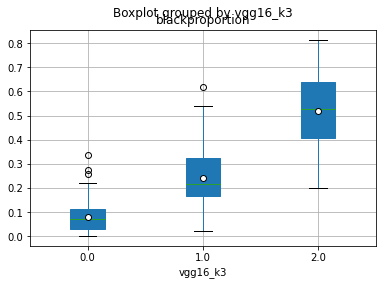

In [60]:
outpath="/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/"
together.boxplot(column=["blackproportion"],by="vgg16_k3",showmeans=True,
                  return_type='dict',patch_artist = True,
                  meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black"})


plt.savefig(outpath+"ClassGlarek3vsBlackproportion_v2.png")

In [63]:
together=together[["pop","bam","mom","dad","sex","vgg16_k3","vgg16_k4"]]
together.to_csv(outpath+"binaryglarek34.tsv",sep="\t",index=False,na_rep=-9)

In [168]:
together=pd.merge(meta,classesPC,on="sample",how="left")
together.head()

,pop,bam,mom,dad,sex,class1,B1,S1U,S1V,S1B,S1G,S1Y,S1R,blackproportion,sample,frog,PC1,PC2,vgg16_k6
0,SK,AG01_S94.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG01,NaN,NaN,NaN,NaN
1,SK,AG02_S231.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG02,NaN,NaN,NaN,NaN
2,SK,AG03_S230.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG03,NaN,NaN,NaN,NaN
3,SK,AG04_S188.r.bam,0,0,1,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG04,NaN,NaN,NaN,NaN
4,SK,AG05_S241.r.bam,0,0,2,-9,1048.452,0.166,0.2,0.283,0.257,0.21,0.302,-9.0,AG05,NaN,NaN,NaN,NaN


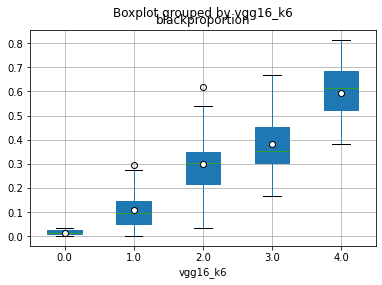

In [169]:
outpath="/Users/dianaaguilar/Documents/GitHub/frogFun/outputFiles/"
together.boxplot(column=["blackproportion"],by="vgg16_k6",showmeans=True,
                  return_type='dict',patch_artist = True,
                  meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black"})


plt.savefig(outpath+"ClassGlarek6vsBlackproportion_v2.png")

In [170]:
#sex ('1' = male, '2' = female, '0' = unknown)
together["sexgwas"]=together["sex"].replace([0,1,2], [-9,1,2])

In [171]:
together=together[["pop","bam","mom","dad","sex","class1","B1",\
                   "S1U","S1V","S1B","S1G","S1Y","S1R","blackproportion","vgg16_k6","PC1","PC2","sexgwas"]]
together.to_csv(outpath+"binaryglarek6_PCs.tsv",sep="\t",index=False,na_rep=-9)

class1    {'whiskers': [Line2D(_child1), Line2D(_child2)...
dtype: object

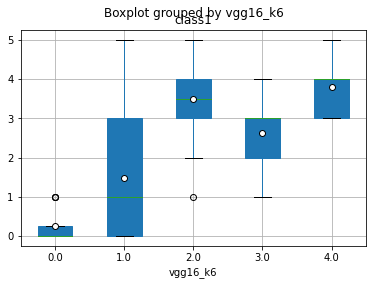

In [165]:
together.boxplot(column=["class1"],by="vgg16_k6",showmeans=True,
                  return_type='dict',patch_artist = True,
                  meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black"})


#plt.savefig(outpath+"ClassGlarek6vsClass1.png")

B1    {'whiskers': [Line2D(_child1), Line2D(_child2)...
dtype: object

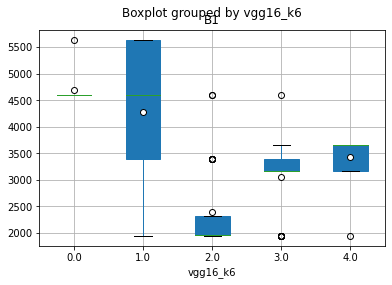

In [166]:
together.boxplot(column=["B1"],by="vgg16_k6",showmeans=True,
                  return_type='dict',patch_artist = True,
                  meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black"})